<a href="https://colab.research.google.com/github/busekosee/OpenCvprojects/blob/main/handtracking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install mediapipe opencv-python


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 34.7 MB/s eta 0:00:00


In [2]:
import cv2
import time
import mediapipe as mp

<IPython.core.display.Javascript object>

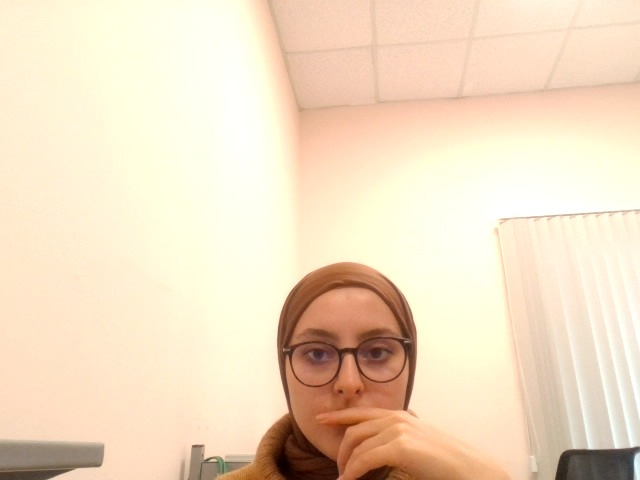

In [7]:

from google.colab.patches import cv2_imshow
import cv2
import numpy as np
from IPython.display import display, Javascript
import os
from PIL import Image
from io import BytesIO


# Kamera başlatma
def start_camera():
    display(Javascript('''
        async function captureImage() {
            const video = document.createElement('video');
            video.width = 640;
            video.height = 480;
            video.autoplay = true;
            video.style.display = 'none';

            const stream = await navigator.mediaDevices.getUserMedia({ video: true });
            document.body.appendChild(video);
            video.srcObject = stream;

            await new Promise((resolve) => video.onplaying = resolve);

            // Görüntü çekme
            const canvas = document.createElement('canvas');
            canvas.width = video.width;
            canvas.height = video.height;
            const context = canvas.getContext('2d');
            context.drawImage(video, 0, 0, video.width, video.height);

            // Görüntüyü veri URL'si olarak al
            const dataUrl = canvas.toDataURL('image/jpeg');
            stream.getTracks().forEach(track => track.stop());

            // JavaScript'ten Python'a veri gönderme
            google.colab.kernel.invokeFunction('notebook.capture', [dataUrl], {});
        }
        captureImage();
    '''))

# Python tarafında görüntü yakalama
def capture(dataUrl):
    # DataURL'yi base64 formatında al
    import base64
    from io import BytesIO

    # Base64'ten byte array'e dönüştürme
    img_data = base64.b64decode(dataUrl.split(',')[1])
    img = Image.open(BytesIO(img_data))

    # Görüntüyü numpy array'e dönüştürme
    img_np = np.array(img)
    img_np = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)

    # Görüntüyü gösterme
    cv2_imshow(img_np)
    cv2.waitKey(1)

# Kameradan görüntü alma başlat
start_camera()

# Python'da görüntü alındığında 'capture' fonksiyonunu çağırır
from google.colab import output
output.register_callback('notebook.capture', capture)




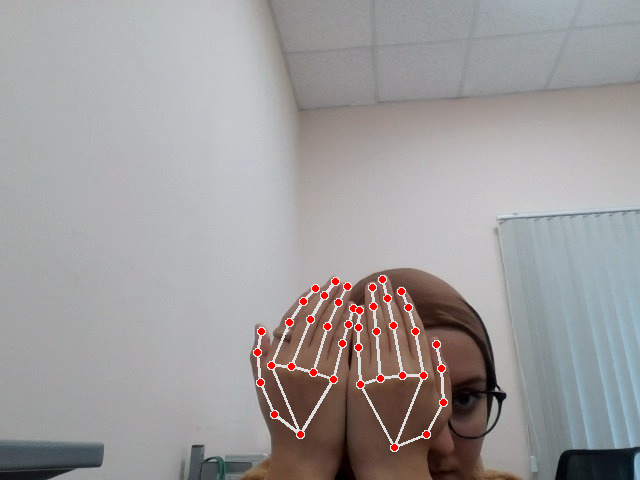

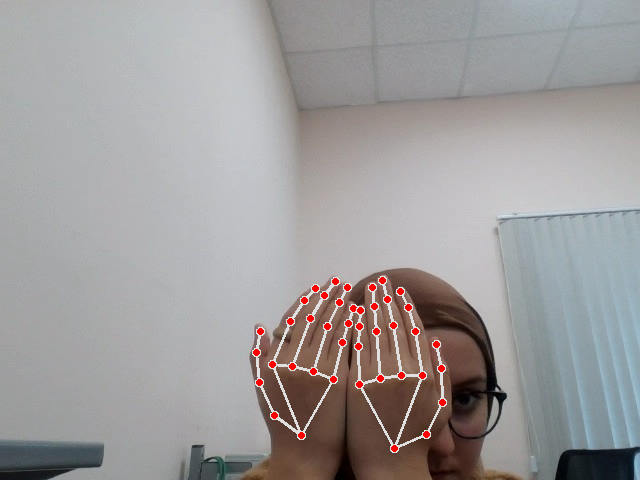

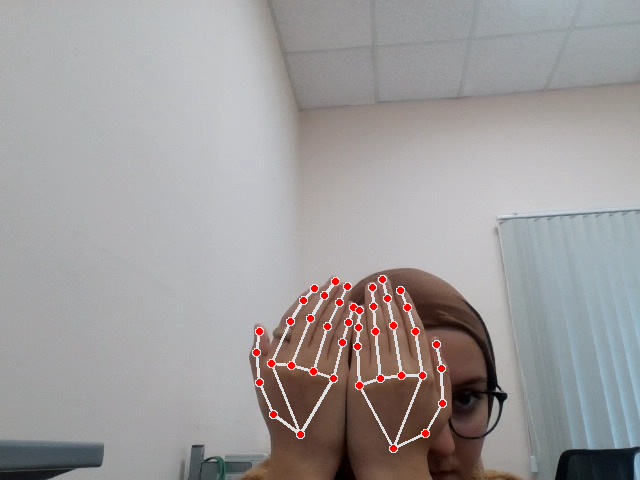

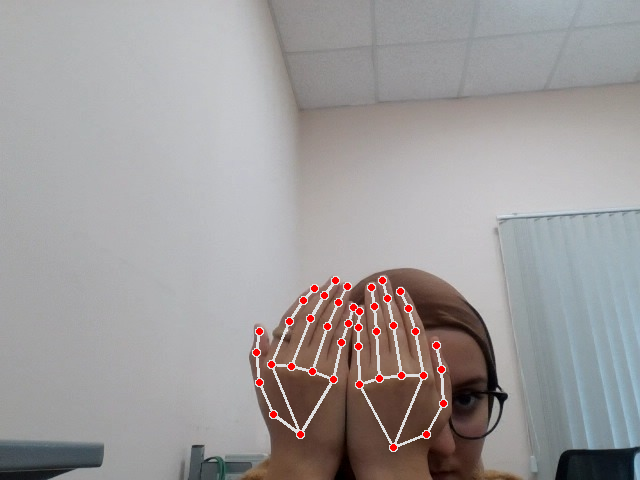

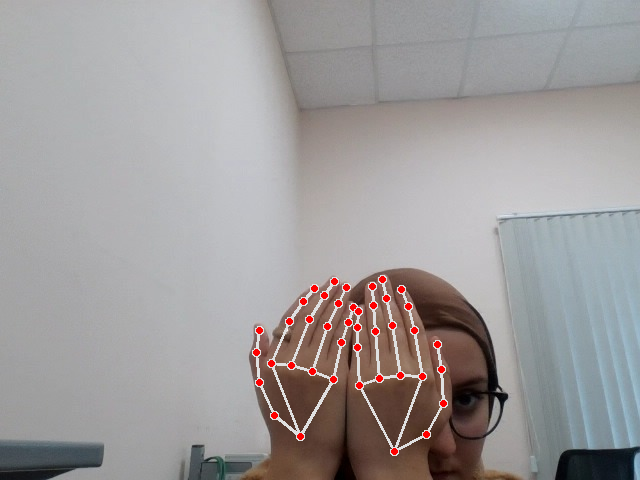

...

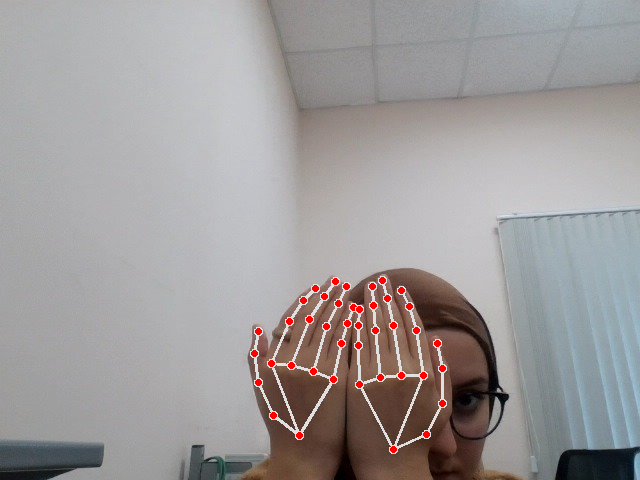

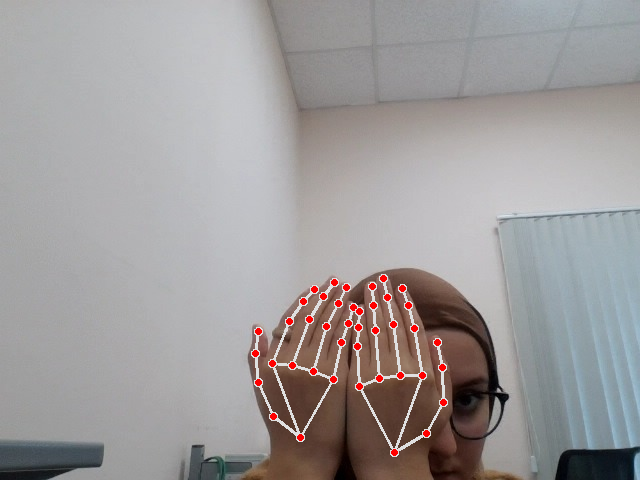

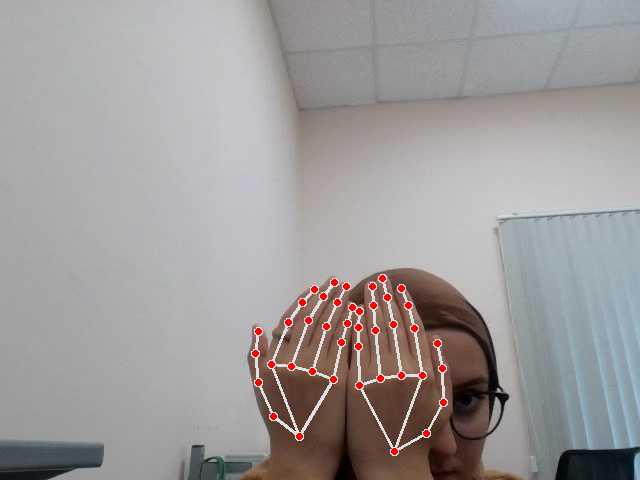

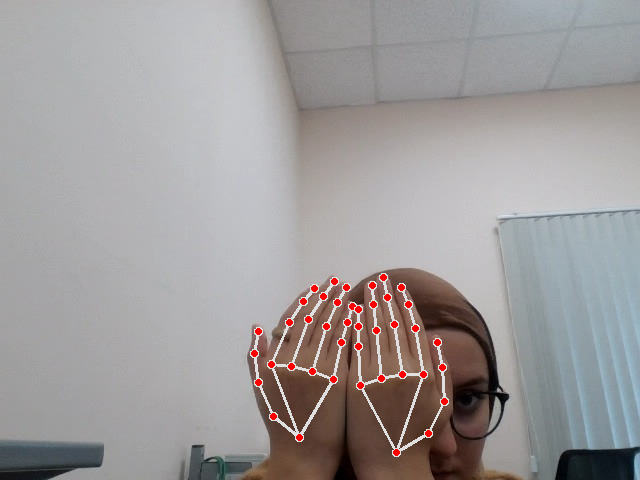

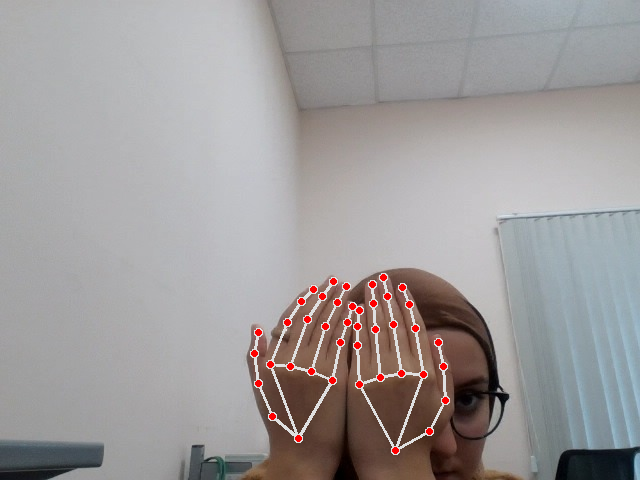

<IPython.core.display.Javascript object>

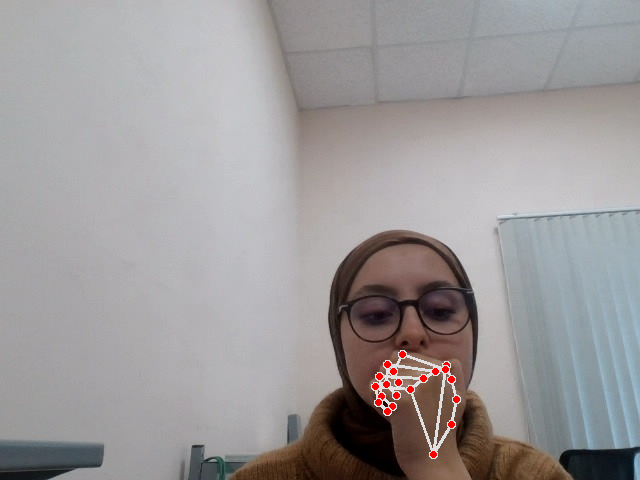

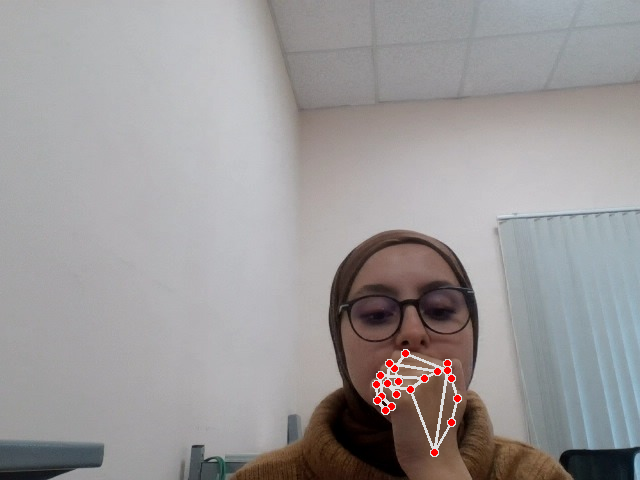

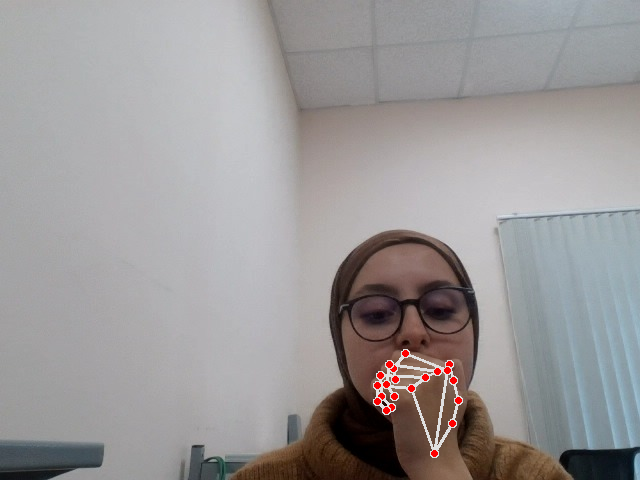

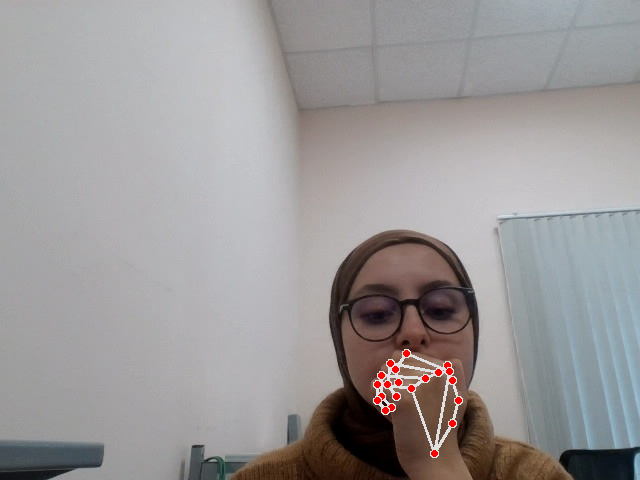

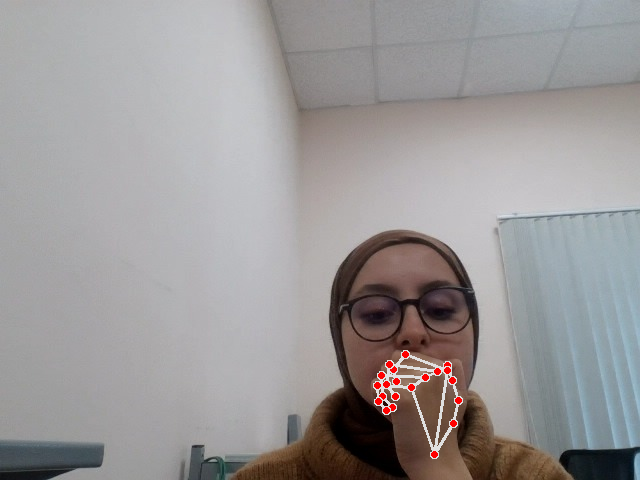

...

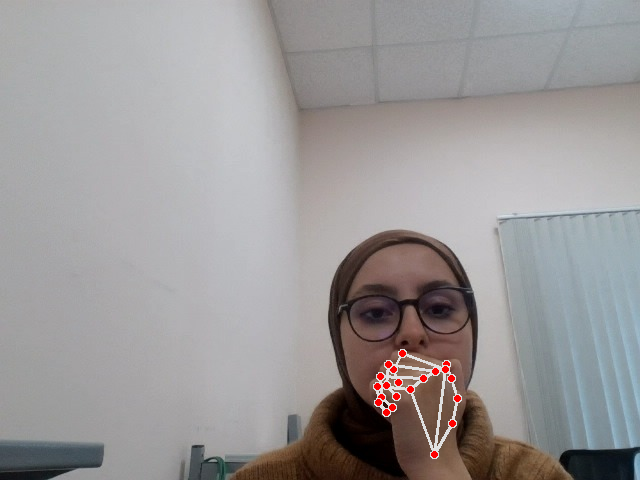

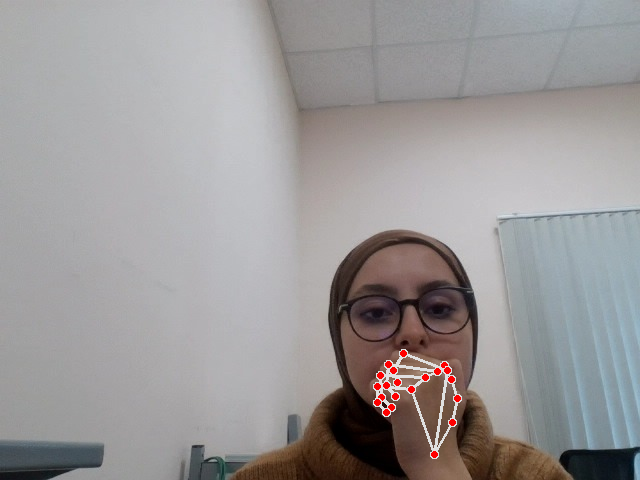

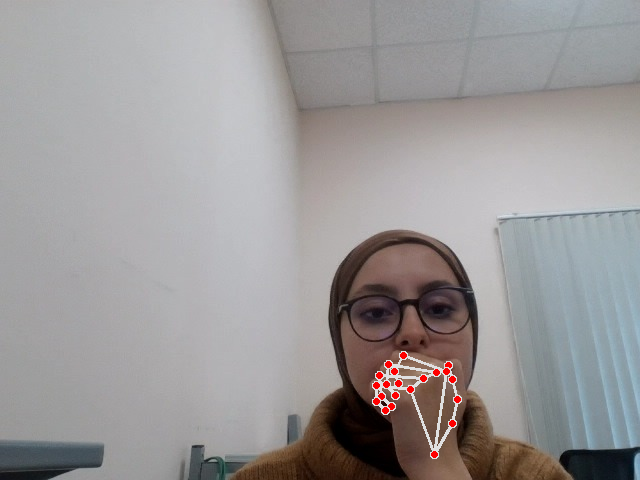

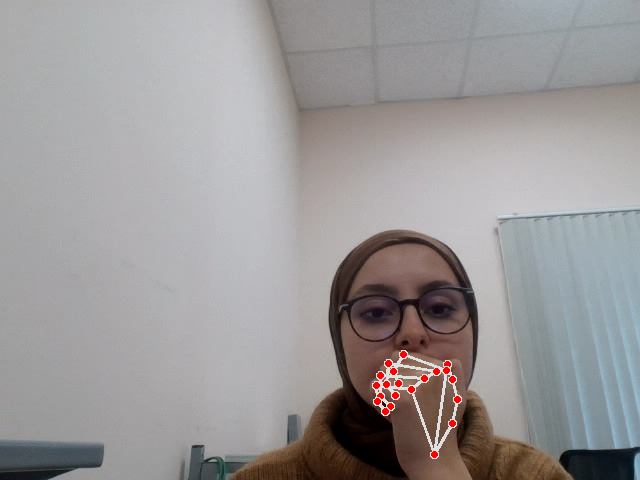

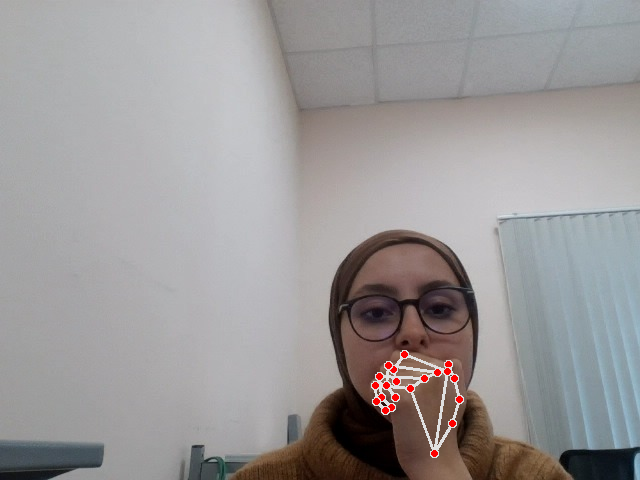

In [2]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
from IPython.display import display, Javascript
from google.colab import output
from PIL import Image
import base64
from io import BytesIO
import mediapipe as mp

# JavaScript ile video başlatma
def start_camera():
    display(Javascript('''
        async function captureImage() {
            const video = document.createElement('video');
            video.width = 640;
            video.height = 480;
            video.autoplay = true;
            video.style.display = 'none';

            const stream = await navigator.mediaDevices.getUserMedia({ video: true });
            document.body.appendChild(video);
            video.srcObject = stream;

            await new Promise((resolve) => video.onplaying = resolve);

            // Frame alıp Python'a gönder
            setInterval(() => {
                const canvas = document.createElement('canvas');
                canvas.width = video.width;
                canvas.height = video.height;
                const context = canvas.getContext('2d');
                context.drawImage(video, 0, 0, video.width, video.height);

                // Görüntüyü veri URL'si olarak al
                const dataUrl = canvas.toDataURL('image/jpeg');
                google.colab.kernel.invokeFunction('notebook.capture', [dataUrl], {});
            }, 100);  // her 100ms'de bir frame al
        }
        captureImage();
    '''))

# Python tarafında görüntü yakalama ve işleme
def capture(dataUrl):
    # Veri URL'sini base64 olarak çözme
    img_data = base64.b64decode(dataUrl.split(',')[1])
    img = Image.open(BytesIO(img_data))

    # Görüntüyü numpy array'e dönüştürme
    img_np = np.array(img)
    img_np = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)

    # Mediapipe hands modülünü başlatma
    mpHands = mp.solutions.hands
    hands = mpHands.Hands()
    mpDraw = mp.solutions.drawing_utils

    # Görüntüyü işleme (El izleme)
    imgRGB = cv2.cvtColor(img_np, cv2.COLOR_BGR2RGB)
    results = hands.process(imgRGB)

    # El izleme sonuçlarını çizme
    if results.multi_hand_landmarks:
        for landmarks in results.multi_hand_landmarks:
            mpDraw.draw_landmarks(img_np, landmarks, mpHands.HAND_CONNECTIONS)

    # Sonuçları Colab'de gösterme
    cv2_imshow(img_np)
    cv2.waitKey(1)  # Video sürekli akıyor, her frame'i göstermek için

# Kameradan sürekli görüntü alma başlat
start_camera()

# Python tarafında görüntü alındığında 'capture' fonksiyonunu çağırır
output.register_callback('notebook.capture', capture)
